In [1]:
import pymc3 as pm
import theano
import numpy as np

Setting number of obs and number of groups

In [2]:
n_obs = 100
n_groups = 10

Create *non-linear* data

In [3]:
X = np.random.randn(n_obs, 1).reshape(n_obs, 1)
mu_sim = np.sin(X) ** 2


Create varying intercepts

In [4]:
groups = np.random.randint(0, n_groups - 1, 100)
alpha_vals = np.random.normal(0, 1, n_groups)
alpha = alpha_vals[ groups]
alpha = alpha.reshape(n_obs, 1)


In [5]:
y_sigma = 1

y = np.random.normal(mu_sim + alpha, y_sigma).reshape(100, )


Using BART

In [7]:
coords = {"group_id": np.arange(n_groups), "obs_id": np.arange(n_obs)}
with pm.Model(coords=coords) as bart_model:
    σ = pm.HalfNormal('σ', sigma = 1)
    group_idx = pm.Data("group_idx", groups, dims = 'obs_id')
    α_μ = pm.Normal('α_μ', 0, 1)
    α_σ = pm.HalfNormal('α_σ', sigma = 1)
    α = pm.Normal('α', α_μ, α_σ, dims = 'group_id')
    α_group = α[group_idx]
    μ = pm.BART('μ', X, y, m=50)
    y_star = pm.Normal('y_star', μ + α_group, σ, observed=y)



In [8]:
with bart_model:
    trace = pm.sample(cores = 2,  nuts={'target_accept':0.99} )



The BART model is experimental. Use with caution.
Multiprocess sampling (2 chains in 2 jobs)
CompoundStep
>NUTS: [α, α_σ, α_μ, σ]
>PGBART: [μ]


In [9]:
output = pm.summary(trace)

In [11]:
output.sort_values('r_hat')

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
μ[83],0.348,0.291,-0.178,0.823,0.022,0.015,182.0,182.0,193.0,251.0,1.00
μ[82],0.224,0.201,-0.170,0.581,0.012,0.008,281.0,281.0,284.0,452.0,1.00
μ[81],1.111,0.345,0.334,1.656,0.022,0.015,254.0,254.0,256.0,291.0,1.00
μ[79],0.340,0.214,-0.051,0.707,0.014,0.010,233.0,233.0,244.0,388.0,1.00
μ[26],0.635,0.192,0.252,0.979,0.012,0.008,272.0,272.0,273.0,410.0,1.00
...,...,...,...,...,...,...,...,...,...,...,...
μ[53],0.819,0.226,0.401,1.246,0.017,0.012,183.0,171.0,204.0,199.0,1.02
μ[66],1.638,0.522,0.966,2.812,0.036,0.026,216.0,207.0,258.0,241.0,1.03
μ[10],0.644,0.360,0.011,1.186,0.030,0.021,147.0,147.0,220.0,144.0,1.03
μ[7],0.771,0.227,0.305,1.196,0.015,0.012,233.0,181.0,247.0,130.0,1.03


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fdf39564ad0>,
      dtype=object)

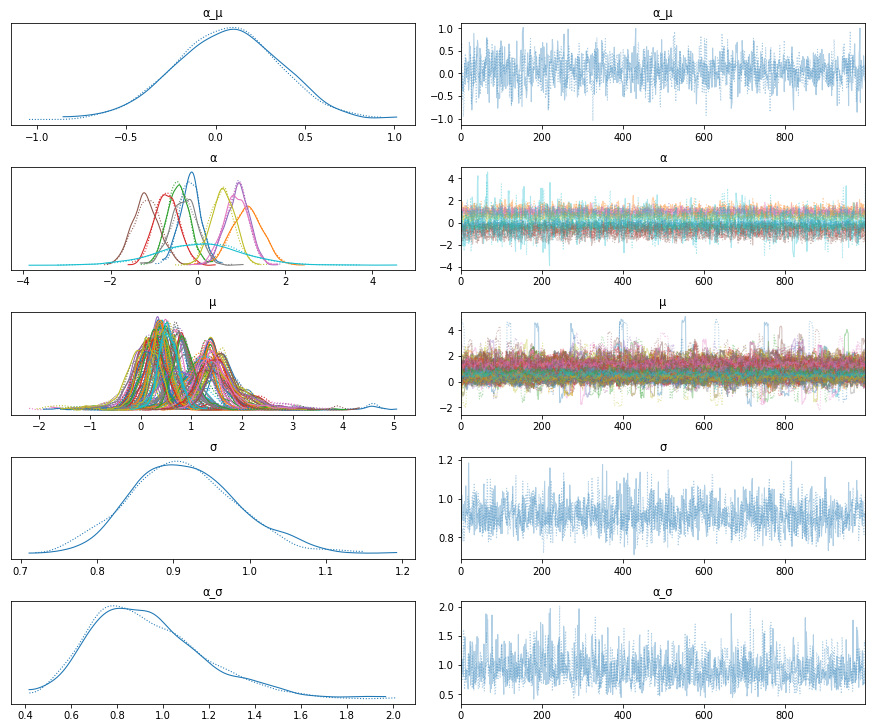

In [12]:
pm.traceplot(trace)

In [13]:
bart_model_pp = pm.sample_posterior_predictive(trace, model=bart_model)

mean_pred = bart_model_pp['y_star'].mean(axis= 0)

In [14]:
# Baseline Variance
np.var(y)

1.8410340283422093

In [15]:
# MSE
np.mean((y - mean_pred)**2)


0.6524551428306161

In [17]:
import seaborn as sns

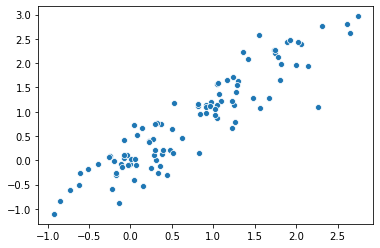

In [41]:
sns.scatterplot(x = (mu_sim + alpha).reshape(n_obs, ), y = mean_pred)